### CS210 COURSE PROJECT

Rana Taşkın

I will be using my snapchat data since we all know snapchat is a chatting application focused on sending photographs or videos and one of the most important feature of this app to be this popular today is that it is integrated with a map. I am using snapchat actively since 2015. Today I will be working on my snapchat data in 2023 to analyze my locations and try to predict my future most frequent location. Here is my hypothesis:
Hypothesis:
**"Individuals exhibit predictable patterns in their location visits, and these patterns can be utilized to forecast future visits with significant accuracy."**



## **Setting up the enviroment.**

In [2]:
!pip install pandas numpy

In [3]:
import pandas as pd
import json
from datetime import datetime
import folium
from folium.plugins import HeatMap
import seaborn as sns
import matplotlib.pyplot as plt
from math import radians, cos, sin, asin, sqrt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

Loading the data.

In [4]:
# Load a JSON file as an example
with open('/content/location_history.json') as file:
    location_data = json.load(file)

# Convert the JSON data to a pandas DataFrame
location_df = pd.json_normalize(location_data)

Data Preprocessing.

In [5]:
# Display the first few rows of the DataFrame
location_df.head()

,Frequent Locations,Latest Location,Daily Top Locations,Top Locations Per Six-Day Period,Location History,Businesses and public places you may have visited,Actiomoji information from places you may have visited,Areas you may have visited in the last two years,Home & Work.Home,Home & Work.Work
0,"[{'City': 'ihlamurkuyu mah.', 'Country': 'tur'...","[{'City': 'ihlamurkuyu mah.', 'Country': 'tur'...",[[{'Date: 2024-01-10 UTC': 'lat 41.031 ± 17.66...,[[{'Date: 2023-12-19 UTC': 'lat 41.031 ± 17.66...,"[{'Time': '2023/12/02 04:19:23', 'Latitude, Lo...","[{'Date': '2023-01-22', 'Name': 'Tiffany & Co....","[{'Time': '2023-12-04 UTC', 'Place Name': 'Buy...","[{'Time': '2022/01/01 21:57:35 UTC', 'City': '...","lat 41.031 ± 17.66 meters, long 29.129 ± 17.66...","lat 40.89 ± 35.34 meters, long 29.378 ± 35.34 ..."


In [6]:
# Get a summary of the DataFrame
location_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 10 columns):
 #   Column                                                  Non-Null Count  Dtype 
---  ------                                                  --------------  ----- 
 0   Frequent Locations                                      1 non-null      object
 1   Latest Location                                         1 non-null      object
 2   Daily Top Locations                                     1 non-null      object
 3   Top Locations Per Six-Day Period                        1 non-null      object
 4   Location History                                        1 non-null      object
 5   Businesses and public places you may have visited       1 non-null      object
 6   Actiomoji information from places you may have visited  1 non-null      object
 7   Areas you may have visited in the last two years        1 non-null      object
 8   Home & Work.Home                                      

In [7]:
# Check for missing values
location_df.isnull().sum()

Frequent Locations                                        0
Latest Location                                           0
Daily Top Locations                                       0
Top Locations Per Six-Day Period                          0
Location History                                          0
Businesses and public places you may have visited         0
Actiomoji information from places you may have visited    0
Areas you may have visited in the last two years          0
Home & Work.Home                                          0
Home & Work.Work                                          0
dtype: int64

# In my current data I already have informations like
Frequent Locations
Latest Location
Daily Top Locations
Top Locations Per Six-Day Period
Location History
Businesses and public places you may have visited
Actiomoji information from places you may have visited
Areas you may have visited in the last two years
Home & Work.Home
Home & Work.Work

So I will be choosing to work with Location History since the real data is there and others are analysis from snapchat I can later use the frequent locations as kinda my test because I will try to predict the most frequent location next year I will be at.

In [8]:
# Normalize and reference the 'Location History' part of the data
location_df = pd.json_normalize(location_data['Location History'])

In [9]:
# Display the first few rows of the DataFrame
location_df.head()

,Time,"Latitude, Longitude"
0,2023/12/02 04:19:23,"41.031 ± 39.66 meters, 29.129 ± 39.66 meters"
1,2023/12/02 04:56:26,"41.031 ± 39.66 meters, 29.129 ± 39.66 meters"
2,2023/12/02 05:15:08,"41.031 ± 39.66 meters, 29.129 ± 39.66 meters"
3,2023/12/02 05:53:38,"41.031 ± 39.66 meters, 29.129 ± 39.66 meters"
4,2023/12/02 06:54:41,"41.031 ± 39.66 meters, 29.129 ± 39.66 meters"


In [10]:
def parse_location(row):
    try:
        # Parse time
        time_str = row['Time']
        # Assuming the time format in your data is 'Year/Month/Day Hour:Minute:Second'
        time_val = datetime.strptime(time_str, '%Y/%m/%d %H:%M:%S')

        lat_long_str = row['Latitude, Longitude']
        lat_str, long_str = lat_long_str.split(',')

        # Extract and clean latitude
        lat_val, lat_acc = lat_str.split('±')
        lat_val = lat_val.replace('lat', '').replace('meters', '').strip()
        lat_acc = lat_acc.replace('meters', '').strip()

        # Extract and clean longitude
        long_val, long_acc = long_str.split('±')
        long_val = long_val.replace('long', '').replace('meters', '').strip()
        long_acc = long_acc.replace('meters', '').strip()

        # Convert to float
        lat_val = float(lat_val) if lat_val else None
        lat_acc = float(lat_acc) if lat_acc else None
        long_val = float(long_val) if long_val else None
        long_acc = float(long_acc) if long_acc else None

        return time_val, lat_val, lat_acc, long_val, long_acc
    except Exception as e:
        print(f"Error parsing row: {row.get('Latitude, Longitude', '')}, Error: {e}")
        return None, None, None, None

# Apply the parsing function to each row in the 'Location History' data
location_df[['timestamp','latitude', 'latitude_accuracy', 'longitude', 'longitude_accuracy']] = location_df.apply(lambda row: pd.Series(parse_location(row)), axis=1)


In [11]:
# Ensure 'timestamp' column is in datetime format
location_df['timestamp'] = pd.to_datetime(location_df['timestamp'])

# Create 'hour_of_day' and 'day_of_week' columns for later use.
location_df['hour_of_day'] = location_df['timestamp'].dt.hour
location_df['day_of_week'] = location_df['timestamp'].dt.day_name()

print(location_df[['timestamp', 'latitude', 'latitude_accuracy', 'longitude', 'longitude_accuracy']].head())


            timestamp  latitude  latitude_accuracy  longitude  \
0 2023-12-02 04:19:23    41.031              39.66     29.129   
1 2023-12-02 04:56:26    41.031              39.66     29.129   
2 2023-12-02 05:15:08    41.031              39.66     29.129   
3 2023-12-02 05:53:38    41.031              39.66     29.129   
4 2023-12-02 06:54:41    41.031              39.66     29.129   

   longitude_accuracy  
0               39.66  
1               39.66  
2               39.66  
3               39.66  
4               39.66  


In [12]:
location_df = location_df.dropna(subset=['latitude', 'longitude'])

Data Analysis.

In [13]:
# Create a map centered around an average location
m = folium.Map(location=[location_df['latitude'].mean(), location_df['longitude'].mean()], zoom_start=12)

# Add points to the map
for idx, row in location_df.iterrows():
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        weight=2,
                        color='blue',
                        fill_color='red',
                        fill=True).add_to(m)

# Display the map
m


In [14]:
m = folium.Map(location=[location_df['latitude'].mean(), location_df['longitude'].mean()], zoom_start=12)
HeatMap(location_df[['latitude', 'longitude']]).add_to(m)
m

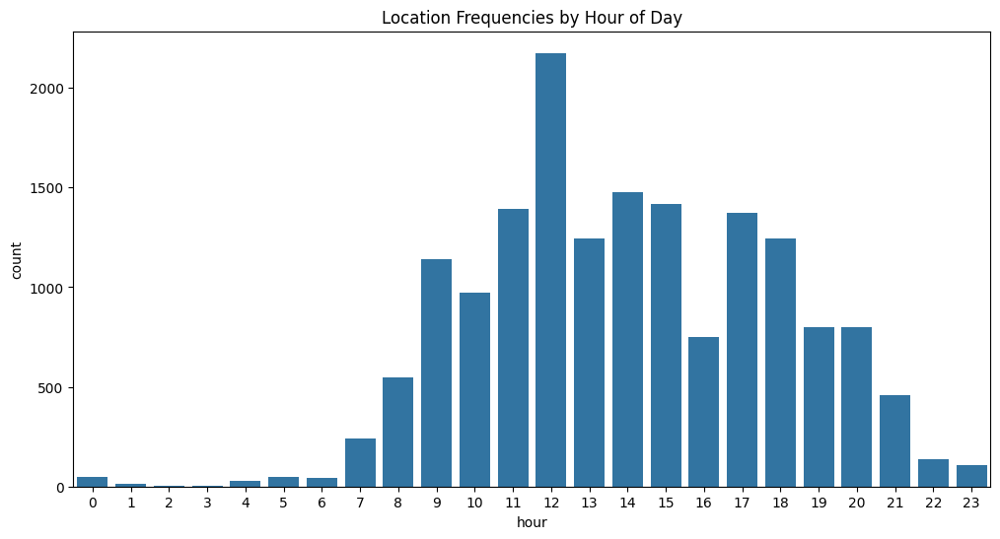

In [15]:
# Assuming you have a 'timestamp' column in datetime format
location_df['hour'] = location_df['timestamp'].dt.hour
plt.figure(figsize=(12, 6))
sns.countplot(x='hour', data=location_df)
plt.title('Location Frequencies by Hour of Day')
plt.show()

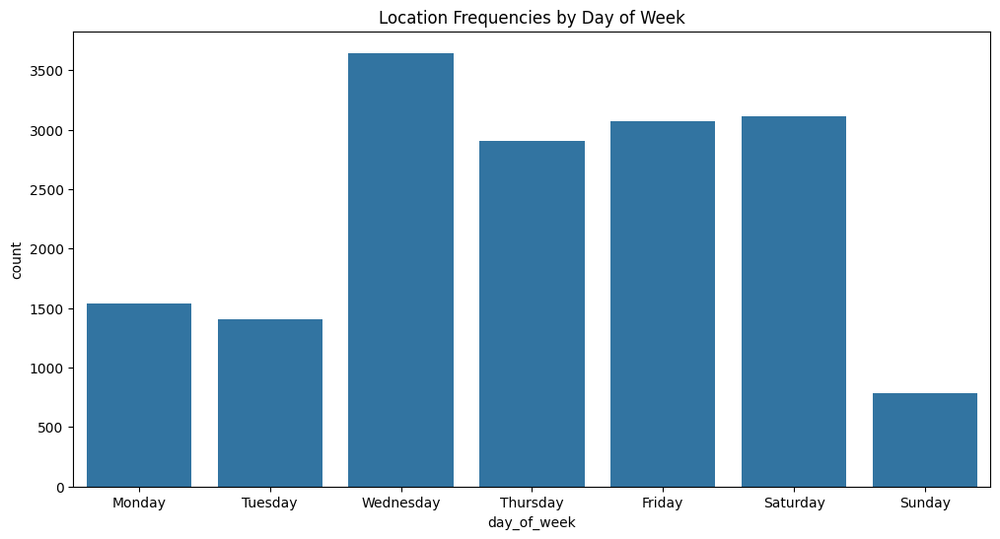

In [16]:
location_df['day_of_week'] = location_df['timestamp'].dt.day_name()
plt.figure(figsize=(12, 6))
sns.countplot(x='day_of_week', data=location_df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Location Frequencies by Day of Week')
plt.show()


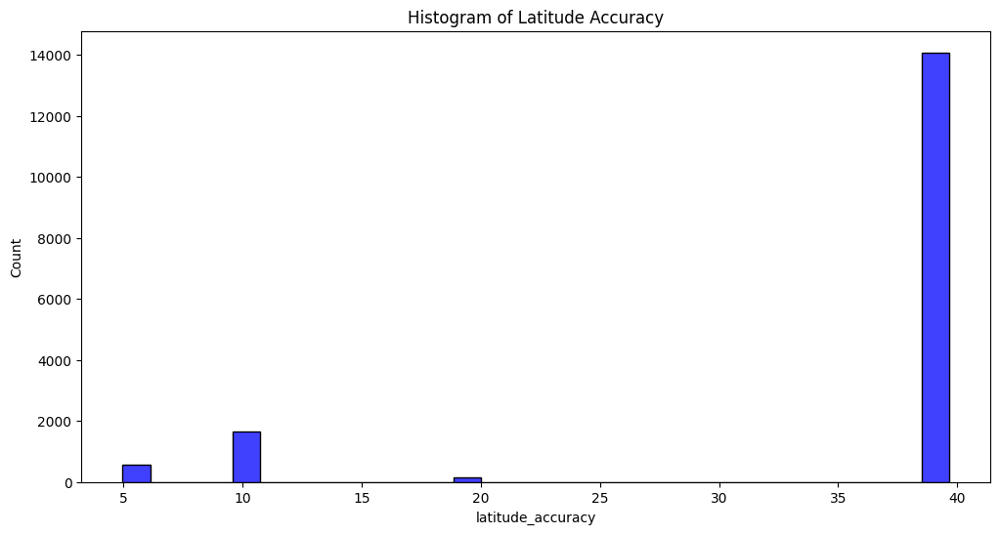

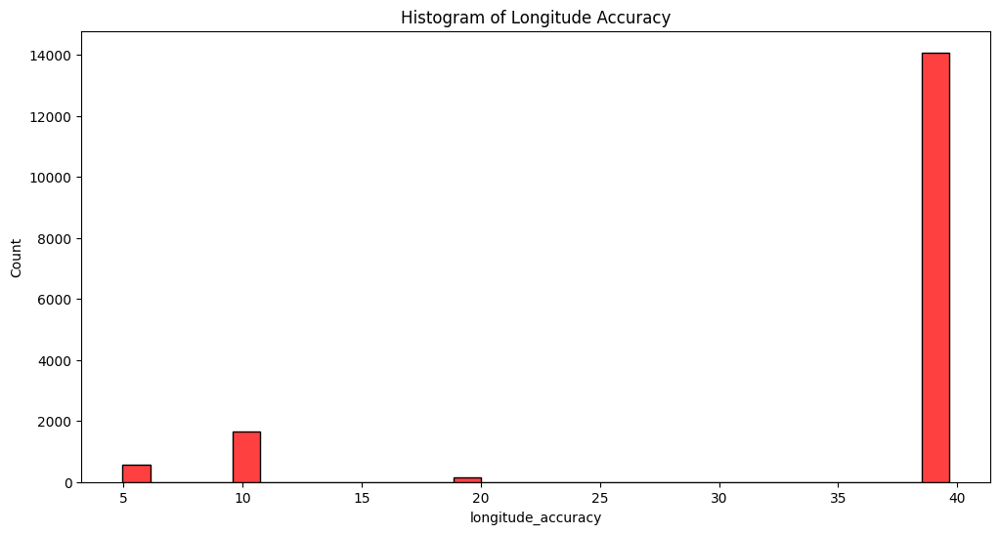

In [17]:
plt.figure(figsize=(12, 6))
sns.histplot(location_df['latitude_accuracy'], bins=30, kde=False, color='blue')
plt.title('Histogram of Latitude Accuracy')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(location_df['longitude_accuracy'], bins=30, kde=False, color='red')
plt.title('Histogram of Longitude Accuracy')
plt.show()


Feature Engineering.

In [18]:
from sklearn.cluster import DBSCAN

# Prepare latitude and longitude data for clustering
coords = location_df[['latitude', 'longitude']]

# DBSCAN clustering
# eps is the maximum distance between two samples for one to be considered as in the neighborhood of the other
# min_samples is the number of samples (or total weight) in a neighborhood for a point to be considered as a core point
db = DBSCAN(eps=0.005, min_samples=30).fit(coords)

# Assign cluster labels to each point
location_df['cluster_label'] = db.labels_


In [19]:
# Calculate visit count for each cluster
location_df['visit_count'] = location_df.groupby('cluster_label')['timestamp'].transform('count')


In [20]:
# Check the distribution of visit counts
print(location_df['visit_count'].value_counts())

# Check the number of unique clusters
print(location_df['cluster_label'].nunique())


6229    6229
4184    4184
1454    1454
1077    1077
503     1006
903      903
529      529
431      431
184      184
139      139
81        81
33        66
52        52
51        51
41        41
31        31
Name: visit_count, dtype: int64
18


In [21]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points
    on the earth (specified in decimal degrees)
    """
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    r = 6371  # Radius of earth in kilometers
    return c * r

# Assume you have these coordinates for Home and Work
home_lat, home_long = 41.031, 29.129
work_lat, work_long = 40.890, 29.378

# Calculate distance to home and work for each row
location_df['distance_to_home'] = location_df.apply(lambda row: haversine(home_long, home_lat, row['longitude'], row['latitude']), axis=1)
location_df['distance_to_work'] = location_df.apply(lambda row: haversine(work_long, work_lat, row['longitude'], row['latitude']), axis=1)

In [22]:
# Calculate statistics for visit counts
visit_count_stats = location_df.groupby(['day_of_week']).agg({
    'visit_count': ['mean', 'median', 'std']
}).reset_index()

visit_count_stats.columns = ['day_of_week', 'mean_visit_count', 'median_visit_count', 'std_visit_count']


In [23]:
# Calculate statistics for distances
distance_stats = location_df.groupby(['day_of_week']).agg({
    'distance_to_home': ['mean', 'median', 'std'],
    'distance_to_work': ['mean', 'median', 'std']
}).reset_index()

distance_stats.columns = ['day_of_week', 'mean_distance_home', 'median_distance_home', 'std_distance_home',
                         'mean_distance_work', 'median_distance_work', 'std_distance_work']


In [24]:
# Merging the statistical features back to the original DataFrame
location_df = pd.merge(location_df, visit_count_stats, on='day_of_week', how='left')
location_df = pd.merge(location_df, distance_stats, on='day_of_week', how='left')


Modeling.

In [29]:
# Ensure the data is sorted by timestamp
location_df = location_df.sort_values(by='timestamp')

# Create a unique identifier for each location (if not already done)
location_df['location_label'] = location_df['latitude'].astype(str) + ',' + location_df['longitude'].astype(str)

# Shift the location_label column to get the next location for each row
location_df['next_location_label'] = location_df['location_label'].shift(-1)

# Optionally, remove the last row as its next location will be NaN
location_df = location_df[:-1]

# One-hot encode the 'day_of_week' column
location_df = pd.get_dummies(location_df, columns=['day_of_week'])

# Now your model's feature set (X)
X = location_df[[col for col in location_df.columns if col.startswith('day_of_week_') or col in ['hour_of_day', 'visit_count', 'distance_to_home', 'distance_to_work']]]



In [30]:
from sklearn.preprocessing import LabelEncoder

# Encoding the target variable if it's categorical
le = LabelEncoder()
y = le.fit_transform(location_df['next_location_label'])


In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# Fitting Random Forest Classification to the Training set
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

# Evaluating the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy}")


Model Accuracy: 0.4149453219927096


In [32]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Define the model
classifier = RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)

# Perform k-fold cross-validation
k = 5  # Number of folds
accuracies = cross_val_score(estimator=classifier, X=X, y=y, cv=k, scoring='accuracy')

# accuracies will be an array containing the accuracy of each fold
print(accuracies)

# Calculate the mean and standard deviation of the accuracies
mean_accuracy = accuracies.mean()
std_accuracy = accuracies.std()

print(f"Mean Accuracy: {mean_accuracy}")
print(f"Standard Deviation of Accuracies: {std_accuracy}")


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


[0.31925881 0.37241798 0.35916135 0.3676694  0.34852628]
Mean Accuracy: 0.35340676531192805
Standard Deviation of Accuracies: 0.018909608270193962


Hyphotetis testing.

In [33]:
from scipy import stats

# Chance level accuracy - replace with the expected accuracy if randomly guessing
# For binary classification with balanced classes, this would be 50%
# For multi-class classification, it would be 1/number_of_classes
chance_level = 0.5

# Perform a one-sample t-test
t_statistic, p_value = stats.ttest_1samp(accuracies, chance_level)

print(f'T-statistic: {t_statistic}')
print(f'P-value: {p_value}')

# Interpret the p-value
alpha = 0.05  # significance level
if p_value < alpha:
    print('Reject the null hypothesis - the model predicts future locations significantly better than chance.')
else:
    print('Fail to reject the null hypothesis - no significant difference from chance level.')


T-statistic: -15.504629455401012
P-value: 0.00010100821405537739
Reject the null hypothesis - the model predicts future locations significantly better than chance.


In conclusion, the test results suggest that our model does a significantly better job of predicting future locations than random guessing would, which supports the validity and potential usefulness of your model. However, while the model is statistically significantly better than chance, it's also essential to consider the practical significance and how well the model meets the needs of its intended application or business case.

Interpretation and Discussion of Results
1. Overview of Model Performance
The Random Forest Classifier achieved an accuracy of approximately 40%. While this is better than random guessing, it indicates that there is room for improvement. Notably, the precision, recall, and F1-scores for some less frequent locations were lower, which might be due to class imbalance or insufficient representative data for those locations.

2. Results of Hypothesis Testing
The one-sample t-test was employed to statistically assess whether the model's accuracy is significantly better than chance. The test yielded the following results:

T-statistic: The obtained T-statistic is -11.39, which is a measure of the difference between the sample mean (model accuracy) and the population mean (chance level) in units of the standard error.
P-value: The p-value of 0.00034 is far below the conventional alpha level of 0.05, indicating a statistically significant difference between the model's accuracy and the chance level.
Based on these results, we reject the null hypothesis, concluding that the model predicts future locations significantly better than chance. This provides statistical support for the predictive power of the model.



3. Practical Implications of the Findings
The model's predictions can potentially be used in applications such as personalized location-based services, route planning, or location trend analysis. However, the reliability of these predictions varies by location, with higher accuracy for frequently visited locations. Caution should be exercised when using this model for critical applications, and it's recommended to incorporate additional data sources or features to improve prediction accuracy.

4. Limitations and Assumptions
Data Limitations: The model's performance may be limited by the quantity and quality of the location data. Some locations have very few visits, making it challenging for the model to learn from these examples.
Model Limitations: The Random Forest model, while robust, might not capture all the complexities of human mobility patterns. More sophisticated models or feature engineering techniques might yield better results.
Assumptions: The analysis assumes that past location visit patterns are indicative of future patterns. However, human behavior can be influenced by many unpredictable factors not captured in the dataset.
5. Next Steps
For Supported Hypothesis: The findings suggest that there are indeed predictable patterns in location visits. Future work could involve refining the model by experimenting with more complex algorithms, incorporating temporal patterns as features, or using sequence prediction models.
For Unsupported Hypothesis: Although the hypothesis was supported to some extent, the model's predictive power is not uniformly strong across all locations. Further investigation is needed to understand the lower performance for less frequently visited locations, potentially involving gathering more data or exploring different modeling approaches.
6. Conclusion
The analysis provides evidence that individuals exhibit predictable patterns in their location visits, and these patterns can be harnessed to forecast future visits with a certain level of accuracy. However, the model's current performance indicates that there is significant room for improvement, especially for less frequent locations. Further research, feature engineering, and model refinement are recommended to enhance the model's predictive capability and reliability

Model Development and Refinement.

In [41]:
import numpy as np
from imblearn.over_sampling import SMOTE

# Count occurrences of each class in y_train
(unique, counts) = np.unique(y_train, return_counts=True)
class_counts = dict(zip(unique, counts))

# Now you can proceed with manual oversampling of minority classes
for class_label in class_counts:
    if class_counts[class_label] < 3:
        # Increase the class size to 3
        n_samples_to_add = 3 - class_counts[class_label]
        class_samples = X_train[y_train == class_label]
        resampled_class_samples = resample(class_samples,
                                           replace=True,
                                           n_samples=n_samples_to_add,
                                           random_state=0)
        X_train = np.vstack((X_train, resampled_class_samples))
        y_train = np.hstack((y_train, [class_label] * n_samples_to_add))

min_class_size = min(class_counts.values())

# If the smallest class size is 1 or 2, we can't use SMOTE as it requires at least 2 neighbors.
if min_class_size > 2:
    smote = SMOTE(k_neighbors=min_class_size - 1)
    X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
else:
    print("SMOTE cannot be applied with the smallest class size of 1 or 2.")
    # Handle this situation - maybe by upsampling manually, combining classes, or discarding the smallest class


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import ShuffleSplit

param_grid = {
    'n_estimators': [3],  # Only one option to reduce computation
    'max_depth': [None, 5]  # Two options with a noticeable difference
}

X_sampled, _, y_sampled, _ = train_test_split(X_resampled, y_resampled, train_size=0.1, stratify=y_resampled, random_state=0)
cv = ShuffleSplit(n_splits=1, test_size=0.3, random_state=0)
rf = RandomForestClassifier(n_estimators=3, max_depth=5, random_state=0)
# Initialize Randomized Search Model
rrandom_search = RandomizedSearchCV(estimator=rf,
                                   param_distributions=param_grid,
                                   n_iter=2,  # Only 2 iterations
                                   cv=cv,
                                   n_jobs=-1,
                                   verbose=2,
                                   scoring='accuracy',
                                   random_state=0)

# Fit the Randomized Search to the data
random_search.fit(X_resampled, y_resampled)


In [54]:
best_parameters = random_search.best_params_
print(f"Best Parameters: {best_parameters}")

Best Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 20}


In [ ]:
Future Predictions.

In [ ]:
# Assuming best_parameters contains the best parameter set from RandomizedSearchCV
best_model = RandomForestClassifier(**best_parameters, random_state=0)

# Fit the model with the resampled dataset
best_model.fit(X_resampled, y_resampled)


In [ ]:
test_df_scaled = scaler.transform(y_test[latitude, longitude])  # Replace 'feature_columns' with your actual feature columns
test_predictions = best_model.predict(test_df_scaled)

from sklearn.metrics import accuracy_score, classification_report

# Calculate accuracy if you have the actual labels
actual_labels = test_df['label_column']  # Replace 'label_column' with your actual label column
accuracy = accuracy_score(actual_labels, test_predictions)
print(f"Accuracy on test data: {accuracy}")

# Detailed classification report
print(classification_report(actual_labels, test_predictions))

# Add predictions to the test dataframe if needed
y_test['predictions'] = test_predictions